In [0]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [0]:
!curl -s https://course.fast.ai/setup/colab | bash

Updating fastai...
featuretools 0.4.1 has requirement pandas>=0.23.0, but you'll have pandas 0.22.0 which is incompatible.
datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.8 which is incompatible.
Done.


In [0]:
!pip install https://github.com/fastai/fastai/archive/1.0.49.zip

In [0]:
from fastai.vision import *
from fastai.callbacks import *

In [0]:
from pathlib import Path

In [0]:
bs = 128

## Downloading data

In [0]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


In [0]:
!mkdir data/models
!!wget http://places2.csail.mit.edu/models_places365/resnet50_places365.pth.tar -P data/models/

In [0]:
!unzip -q data.zip -d data #Dataset

In [0]:
!ls

data  models


In [0]:
!ls data

models	test_WyRytb0.csv  train  train.csv


In [0]:
path = Path("./data/")
train_path = path/'train.csv'
test_path = path/'test_WyRytb0.csv'
train_path, test_path

(PosixPath('data/train.csv'), PosixPath('data/test_WyRytb0.csv'))

In [0]:
import os
import shutil

In [0]:
os.mkdir(path/'test')

In [0]:
with open(path/'test_WyRytb0.csv') as f:
  fnames = f.read().split()
  for name in fnames:
    try:
      shutil.move(path/'train'/name, path/'test'/name)
    except Exception as e:
      print(e, "can't move "+name)

[Errno 2] No such file or directory: 'data/train/image_name' can't move image_name


In [0]:
!ls data/test

In [0]:
np.random.seed(42)

In [0]:
data = ImageDataBunch.from_csv(path=path, folder='train', csv_labels='train.csv', test='test', ds_tfms=get_transforms(), size=128, bs=bs).normalize(imagenet_stats)

In [0]:
import torchvision
import torch
from collections import OrderedDict

In [0]:
places_res50 = torch.load('data/models/resnet50_places365.pth.tar',  map_location=lambda storage, loc: storage)

In [0]:
default_res50 = models.resnet50()
state_dict = places_res50['state_dict'] 
new_state_dict = OrderedDict()

In [0]:
for key in model_state_dict.keys():
  new_state_dict[key[7:]]= state_dict[key]
  

In [0]:
default_res50.fc = torch.nn.Linear(2048, 365) # Matching with default res50 dense layer
default_res50.load_state_dict(new_state_dict)

In [0]:
def new_resnet(prtn):
  return default_res50

In [0]:
def get_data(sz, bs):
  data = ImageDataBunch.from_csv(path=path, folder='train', csv_labels='train.csv', test='test', ds_tfms=get_transforms(), size=sz, bs=bs).normalize(imagenet_stats)
  return data

In [0]:
learn = cnn_learner(get_data(32, 512), new_resnet, metrics=[error_rate, accuracy])

In [0]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.229119,0.757850,0.261597,0.738403,00:57
1,0.962808,0.647088,0.233999,0.766001,00:39
2,0.831656,0.610522,0.220200,0.779800,00:39
3,0.747663,0.582801,0.213447,0.786553,00:39
4,0.693894,0.580010,0.210511,0.789489,00:39


In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


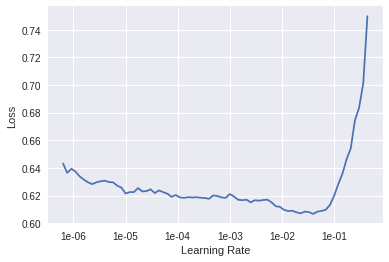

In [0]:
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(3, max_lr=1e-05)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.626515,0.578817,0.208749,0.791251,00:39
1,0.622651,0.578843,0.206107,0.793893,00:39
2,0.621203,0.577890,0.210511,0.789489,00:39


In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


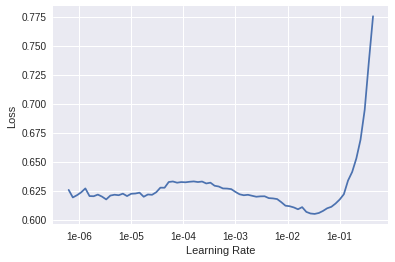

In [0]:
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(3)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.621004,0.584834,0.208456,0.791544,00:40
1,0.626893,0.567570,0.205226,0.794774,00:39
2,0.604415,0.554348,0.198767,0.801233,00:39


In [0]:
learn.save('places_res50_32x32')

In [0]:
learn = cnn_learner(get_data(48, 512), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_32x32')

In [0]:
learn.fit_one_cycle(5) 

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.524710,0.415261,0.149442,0.850558,01:07
1,0.486796,0.397714,0.145332,0.854668,00:49
2,0.452605,0.374860,0.135056,0.864944,00:48
3,0.418621,0.367164,0.129184,0.870816,00:49
4,0.395793,0.362583,0.128890,0.871110,00:49


In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


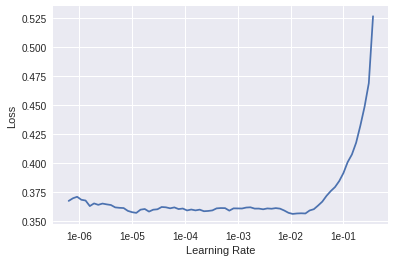

In [0]:
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(3, max_lr=1e-05)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.364585,0.362614,0.127716,0.872284,00:49
1,0.359591,0.362331,0.129184,0.870816,00:49
2,0.359288,0.362248,0.128597,0.871403,00:48


In [0]:
learn.save('places_res50_48x48')

In [0]:
learn = cnn_learner(get_data(64, 512), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_48x48')

In [0]:
learn.fit_one_cycle(5) 

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.317461,0.276654,0.099237,0.900763,01:09
1,0.309036,0.273133,0.102173,0.897827,00:57
2,0.290563,0.274615,0.100117,0.899883,00:57
3,0.274813,0.268026,0.097475,0.902525,00:57
4,0.259435,0.264936,0.095713,0.904287,00:57


In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


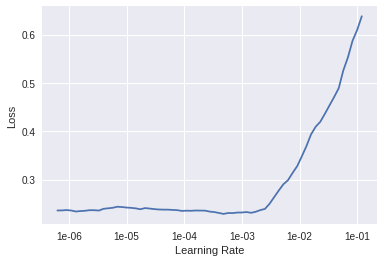

In [0]:
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(8, max_lr=1e-03)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.247255,0.239443,0.091016,0.908984,00:58
1,0.245887,1.229024,0.181738,0.818262,00:59
2,0.264270,0.464332,0.148855,0.851145,00:59
3,0.238404,0.307916,0.107751,0.892249,00:58
4,0.202830,0.287003,0.091603,0.908397,00:58
5,0.160982,0.281041,0.091897,0.908103,00:59
6,0.122740,0.274874,0.086318,0.913682,00:59
7,0.092462,0.270654,0.082795,0.917205,00:59


In [0]:
learn.save('places_res50_64x64')

In [0]:
learn = cnn_learner(get_data(128, 128), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_64x64')

In [0]:
learn.fit_one_cycle(5) 

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.165563,0.145280,0.053729,0.946271,01:41
1,0.168395,0.139866,0.048444,0.951556,01:27
2,0.150946,0.132765,0.046389,0.953611,01:27
3,0.138815,0.130765,0.044040,0.955960,01:27
4,0.118374,0.128914,0.045802,0.954198,01:27


In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


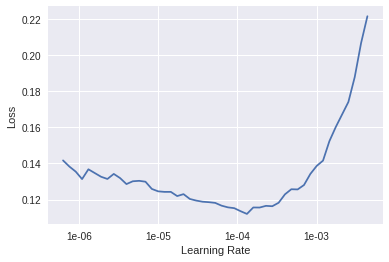

In [0]:
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(8, max_lr=1e-04)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.122246,0.128090,0.041104,0.958896,01:51
1,0.128971,0.142149,0.045214,0.954786,01:51
2,0.119111,0.161356,0.052554,0.947446,01:51
3,0.092118,0.160894,0.051380,0.948620,01:51
4,0.072669,0.143378,0.045508,0.954492,01:51
5,0.049202,0.148788,0.046389,0.953611,01:51
6,0.037375,0.156736,0.044921,0.955079,01:51
7,0.030951,0.156777,0.045508,0.954492,01:52


In [0]:
learn.save('places_res50_128x128')

In [0]:
learn = cnn_learner(get_data(224, 64), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_128x128')

In [0]:
learn.fit_one_cycle(5) 

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.118730,0.072368,0.025250,0.974750,04:20
1,0.127579,0.070330,0.027305,0.972695,04:07
2,0.106592,0.069921,0.024662,0.975338,04:07
3,0.095772,0.061782,0.021139,0.978861,04:08
4,0.076849,0.062010,0.022314,0.977686,04:08


In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


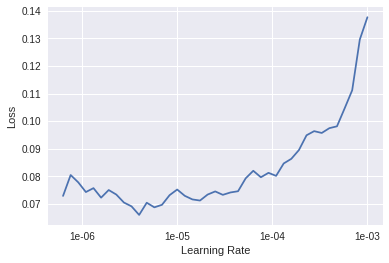

In [0]:
learn.recorder.plot()

In [0]:
learn.save('places_res50_224x224_0')

In [0]:
def make_submission(learn, filename):
  log_preds, test_labels = learn.get_preds(ds_type=DatasetType.Test)
  preds = np.argmax(log_preds, 1)
  a = np.array(preds)
  submission = pd.DataFrame({'image_name': os.listdir('data/test'), 'label': a})
  submission.to_csv(path/filename, index=False)

In [0]:
def make_submission_tta(learn, filename):
  log_preds, test_labels = learn.TTA(ds_type=DatasetType.Test)
  preds = np.argmax(log_preds, 1)
  a = np.array(preds)
  submission = pd.DataFrame({'image_name': os.listdir('data/test'), 'label': a})
  submission.to_csv(path/filename, index=False)

In [0]:
learn.load('places_res50_224x224_0')
make_submission(learn, 'places_res50_224x224_0.csv')

In [0]:
make_submission_tta(learn, 'places_res50_224x224_0_tta.csv')

In [0]:
learn.load('places_res50_224x224_0')

In [0]:
learn.fit_one_cycle(8, max_lr=7e-06)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.083602,0.060245,0.022314,0.977686,05:27
1,0.087231,0.059705,0.020552,0.979448,05:28
2,0.079358,0.059879,0.020258,0.979742,05:28
3,0.072373,0.060268,0.020552,0.979448,05:27
4,0.071947,0.059941,0.019965,0.980035,05:27
5,0.062146,0.058733,0.021139,0.978861,05:28
6,0.057560,0.059721,0.021433,0.978567,05:28
7,0.057672,0.058919,0.020846,0.979154,05:27


In [0]:
learn.save('places_res50_224x224_1')

In [0]:
make_submission(learn, 'places_res50_224x224_1.csv')

In [0]:
make_submission_tta(learn, 'places_res50_224x224_1_tta.csv')

In [0]:
learn = cnn_learner(get_data(224, 64), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_224x224_1').mixup()

In [0]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.856415,0.147020,0.010863,0.989137,04:10
1,0.767125,0.171363,0.015267,0.984733,03:59
2,0.754002,0.168689,0.019084,0.980916,03:59
3,0.742016,0.190332,0.017029,0.982971,03:59
4,0.737630,0.181409,0.016735,0.983265,03:59


In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


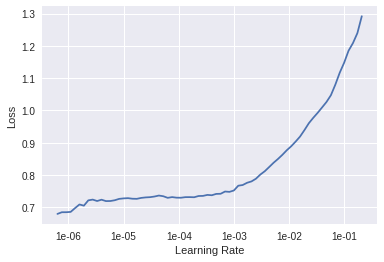

In [0]:
learn.recorder.plot()

In [0]:
learn.save('places_res50_224x224_mixup_0')

In [0]:
make_submission(learn, 'places_res50_224x224_mixup_0.csv')

In [0]:
make_submission_tta(learn, 'places_res50_224x224_mixup_0_tta.csv')

## Mixup

In [0]:
learn = cnn_learner(get_data(224, 64), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_224x224_mixup_0').mixup()

In [0]:
learn.unfreeze()

In [0]:
learn.fit_one_cycle(8, max_lr=1e-06)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.728356,0.184230,0.019378,0.980622,05:14
1,0.729660,0.183316,0.017322,0.982678,05:15
2,0.719493,0.182626,0.019084,0.980916,05:15
3,0.718100,0.185538,0.019084,0.980916,05:15
4,0.732428,0.187613,0.019084,0.980916,05:15
5,0.730571,0.186543,0.018790,0.981210,05:15
6,0.723700,0.183152,0.019378,0.980622,05:15
7,0.730987,0.188252,0.019084,0.980916,05:15


In [0]:
learn.save('places_res50_224x224_mixup_1')

In [0]:
make_submission(learn, 'places_res50_224x224_mixup_1.csv')

In [0]:
make_submission_tta(learn, 'places_res50_224x224_mixup_1_tta.csv')

## Reducing number of epochs

In [0]:
learn = cnn_learner(get_data(32, 512), new_resnet, metrics=[error_rate, accuracy])

In [0]:
learn.fit_one_cycle(1)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.175892,0.727592,0.270112,0.729888,00:57


In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


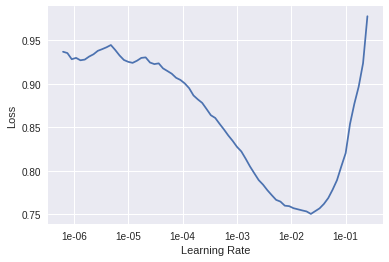

In [0]:
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(3)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.682963,0.567636,0.190546,0.809454,00:40
1,0.552961,0.460595,0.166471,0.833529,00:39
2,0.461367,0.438937,0.160893,0.839107,00:39


In [0]:
learn.save('places_res50_32x32')

In [0]:
learn = cnn_learner(get_data(48, 512), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_32x32')

In [0]:
learn.fit_one_cycle(1) 

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.413372,0.355695,0.126835,0.873165,01:04


In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


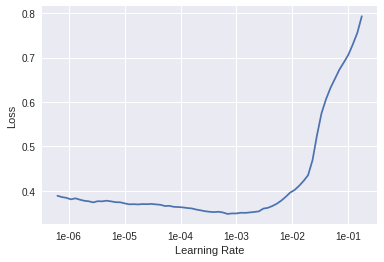

In [0]:
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(3, max_lr=1e-05)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.373290,0.345175,0.120963,0.879037,00:47
1,0.360493,0.334085,0.119201,0.880799,00:48
2,0.347261,0.331974,0.120963,0.879037,00:48


In [0]:
learn.save('places_res50_48x48')

In [0]:
learn = cnn_learner(get_data(64, 512), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_48x48')

In [0]:
learn.fit_one_cycle(1) 

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.317589,0.269118,0.093071,0.906929,01:06


In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


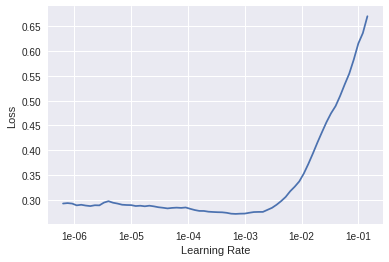

In [0]:
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(3, max_lr=1e-03)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.298690,1.218037,0.194069,0.805931,01:00
1,0.294018,0.275799,0.092190,0.907810,00:57
2,0.237284,0.239551,0.086318,0.913682,00:57


In [0]:
learn.save('places_res50_64x64')

In [0]:
learn = cnn_learner(get_data(128, 128), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_64x64')

In [0]:
learn.fit_one_cycle(1) 

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.198184,0.164987,0.058720,0.941280,01:41


In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


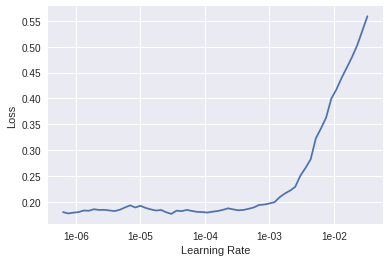

In [0]:
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(3, max_lr=1e-04)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.181774,0.171569,0.058133,0.941867,01:49
1,0.155414,0.151445,0.055784,0.944216,01:49
2,0.117000,0.147936,0.053729,0.946271,01:49


In [0]:
learn.save('places_res50_128x128')

In [0]:
learn = cnn_learner(get_data(224, 64), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_128x128')

In [0]:
learn.fit_one_cycle(1) 

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.170752,0.124660,0.042572,0.957428,04:02


In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


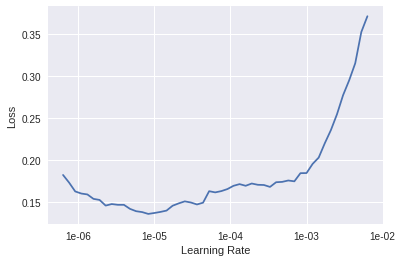

In [0]:
learn.recorder.plot()

In [0]:
learn.save('places_res50_224x224_0')

In [0]:
# learn = cnn_learner(get_data(224, 64), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_224x224_0')

In [0]:
# learn.fit_one_cycle(3, max_lr=1e-05)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.159155,0.119061,0.038168,0.961832,04:11
1,0.150028,0.114871,0.036406,0.963594,04:11
2,0.149662,0.116582,0.037287,0.962713,04:11


In [0]:
# learn.save('places_res50_224x224_1')

In [0]:
# make_submission(learn, 'places_res50_224x224_1.csv')

In [0]:
# make_submission_tta(learn, 'places_res50_224x224_1_tta.csv')

## Check most confused

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

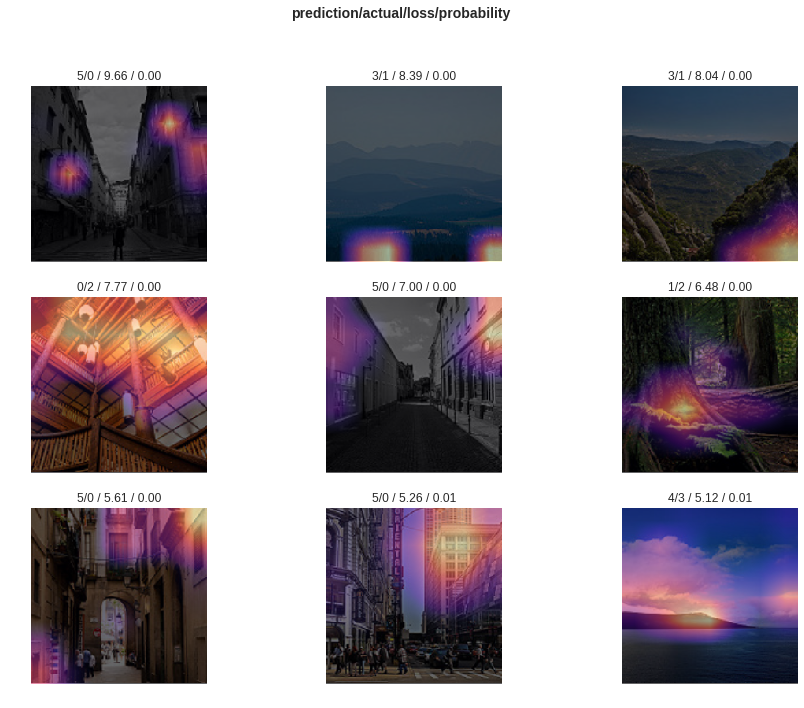

In [0]:
interp.plot_top_losses(9, figsize=(15,11))

In [0]:
interp.most_confused(min_val=2)

[(3, 2, 32),
 (2, 3, 26),
 (0, 5, 24),
 (5, 0, 11),
 (2, 1, 9),
 (4, 3, 7),
 (4, 2, 6),
 (4, 0, 4),
 (1, 3, 2),
 (2, 0, 2)]

In [0]:
import pandas as pd
from pathlib import Path

In [0]:
path = Path('data')
path

PosixPath('data')

In [0]:
df = pd.read_csv(path/'train.csv')

In [0]:
df.shape

(17034, 2)

In [0]:
df2 = df[df.label.isin([0, 2, 3, 5])]

In [0]:
df = df.append(df2, ignore_index=True)

In [0]:
df.shape

(28539, 2)

In [0]:
df.to_csv(path/'train2.csv', index=False)

In [0]:
data = ImageDataBunch.from_csv(path=path, folder='train', csv_labels='train2.csv', test='test', ds_tfms=get_transforms(), size=128, bs=bs).normalize(imagenet_stats)

In [0]:
learn = cnn_learner(get_data(224, 64), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_224x224_0')

In [0]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.156472,0.119560,0.039049,0.960951,04:11
1,0.162860,0.116511,0.039049,0.960951,04:11
2,0.159128,0.119757,0.037581,0.962419,04:12
3,0.132347,0.105721,0.033470,0.966530,04:12
4,0.118956,0.107232,0.031709,0.968291,04:11


In [0]:
interp = ClassificationInterpretation.from_learner(learn)

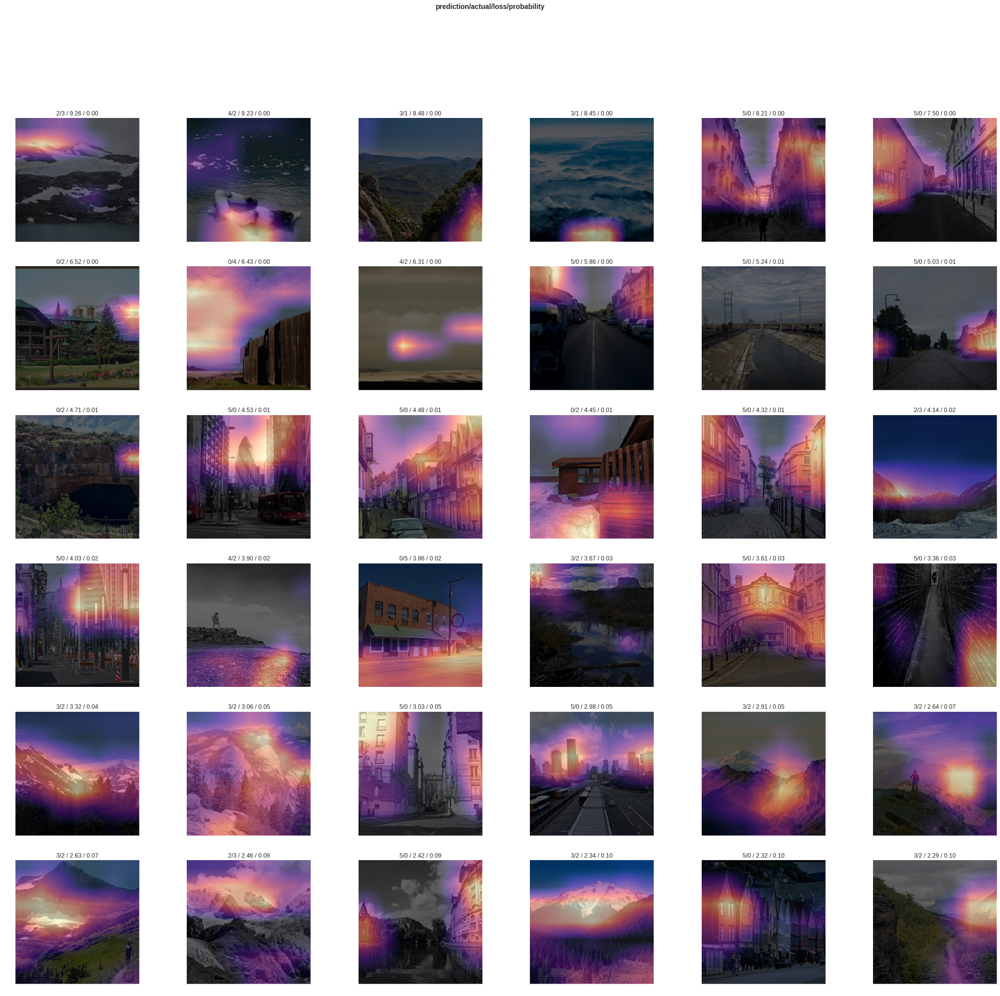

In [0]:
interp.plot_top_losses(36, figsize=(36,32))

In [0]:
interp.most_confused(min_val=2)

[(2, 3, 30),
 (0, 5, 27),
 (3, 2, 25),
 (5, 0, 11),
 (1, 3, 3),
 (2, 0, 3),
 (2, 4, 3),
 (4, 0, 2),
 (4, 3, 2)]

In [0]:
make_submission(learn, 'places_res50_224x224_0_most_confused')

## Grad Cam

In [0]:
!wget https://raw.githubusercontent.com/anhquan0412/animation-classification/master/gradcam.py

--2019-03-22 06:59:16--  https://raw.githubusercontent.com/anhquan0412/animation-classification/master/gradcam.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6373 (6.2K) [text/plain]
Saving to: ‘gradcam.py’

gradcam.py          100%[===================>]   6.22K  --.-KB/s    in 0s      

2019-03-22 06:59:16 (92.3 MB/s) - ‘gradcam.py’ saved [6373/6373]



In [0]:
learn = cnn_learner(get_data(224, 64), new_resnet, metrics=[error_rate, accuracy])

In [0]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.193969,0.139768,0.050206,0.949794,03:56
1,0.168387,0.148197,0.051967,0.948033,03:57
2,0.157860,0.131407,0.048150,0.951850,03:57
3,0.136793,0.123804,0.043159,0.956841,03:57
4,0.121885,0.119394,0.043159,0.956841,03:57


In [0]:
get_transforms()

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmPixel (flip_lr), kwargs={}, p=0.5, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmCoord (symmetric_warp), kwargs={'magnitude': (-0.2, 0.2)}, p=0.75, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10.0, 10.0)}, p=0.75, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (zoom), kwargs={'scale': (1.0, 1.1), 'row_pct': (0, 1), 'col_pct': (0, 1)}, p=0.75, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmLighting (brightness), kwargs={'change': (0.4, 0.6)}, p=0.75, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmLighting (contrast), kwargs={'scale': (0.8, 1.25)}, p=0.75, resolved={}, do_run=True, is_random=True)],
 [RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, res

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

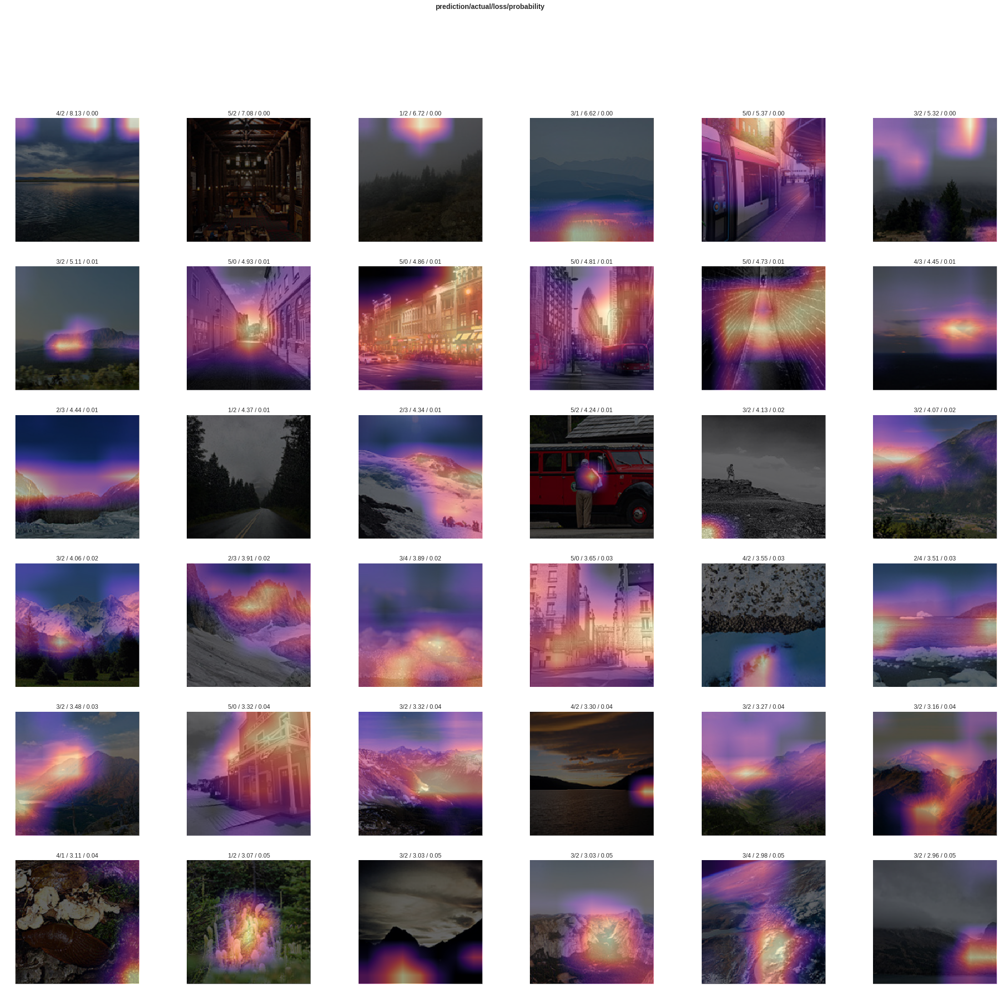

In [0]:
interp.plot_top_losses(36, figsize=(36,32))

In [0]:
interp.most_confused(min_val=2)

[(3, 2, 52),
 (2, 3, 49),
 (0, 5, 31),
 (5, 0, 23),
 (2, 4, 4),
 (3, 4, 4),
 (4, 3, 4),
 (1, 3, 3),
 (2, 1, 3),
 (4, 2, 3),
 (1, 2, 2),
 (2, 5, 2)]

In [0]:
from gradcam import *

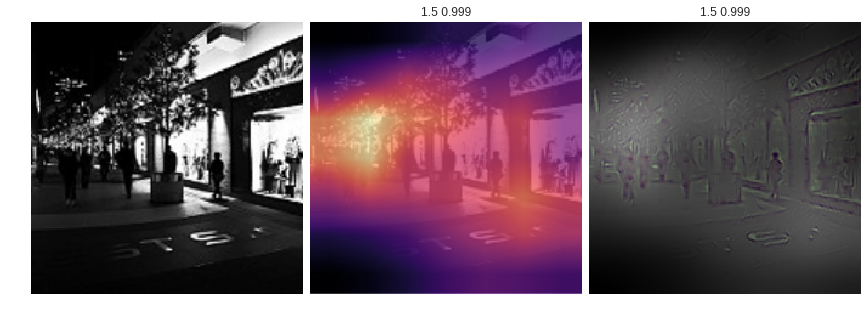

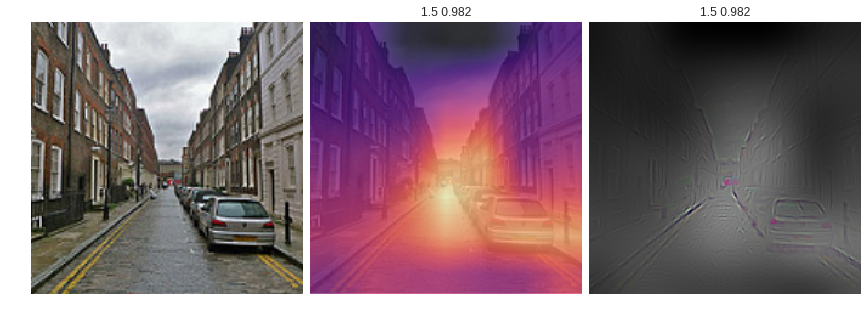

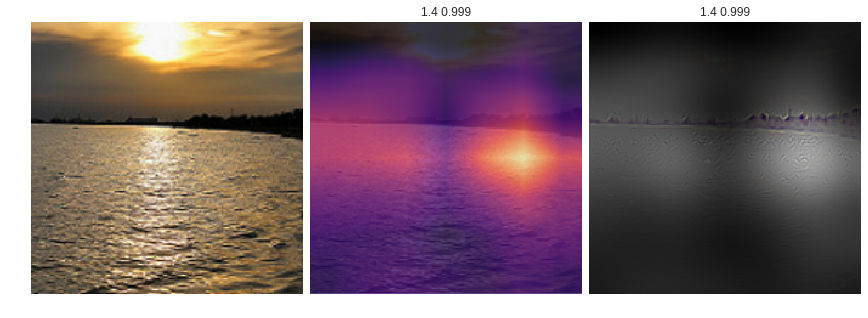

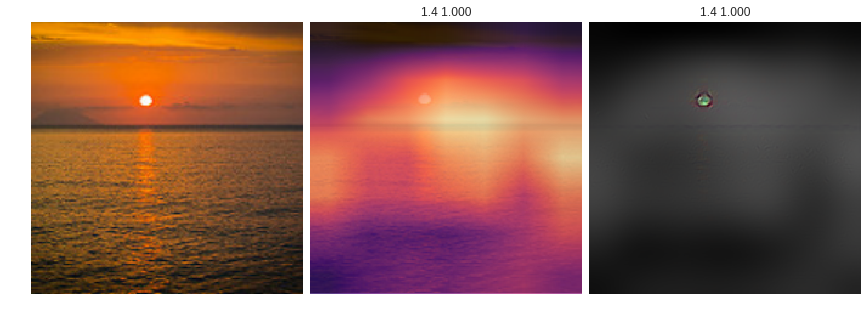

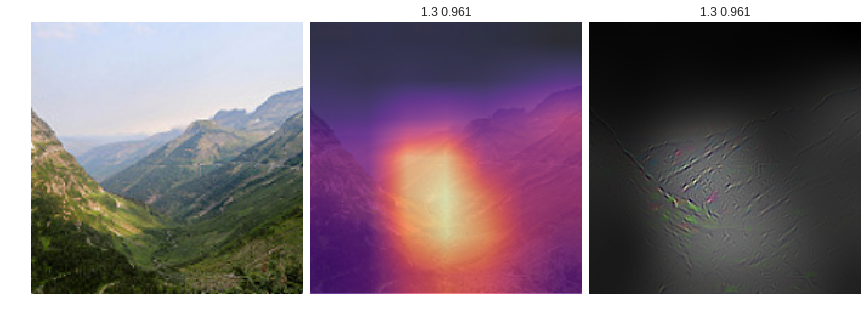

...

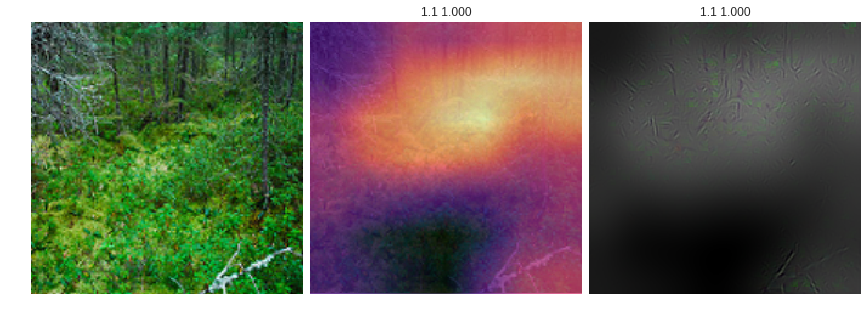

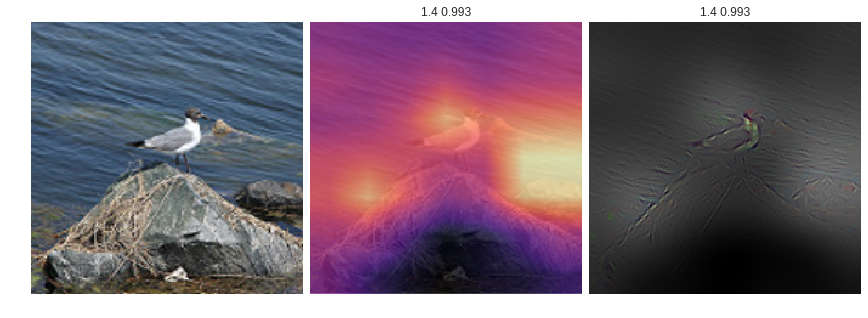

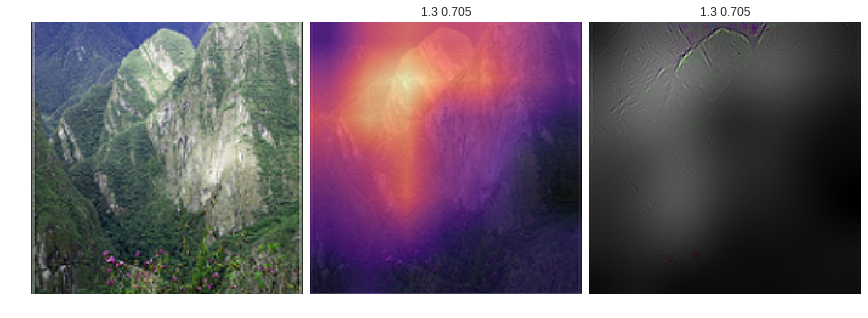

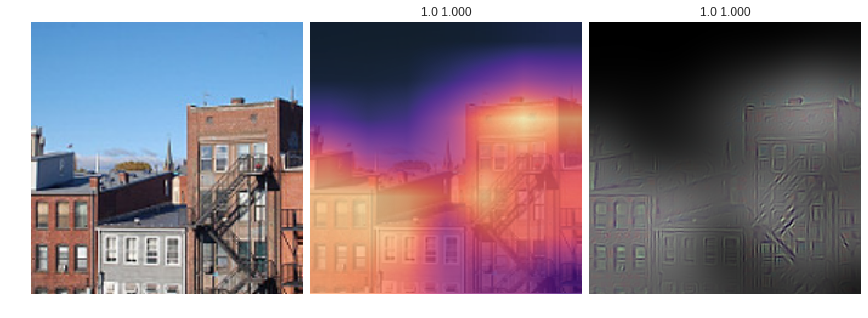

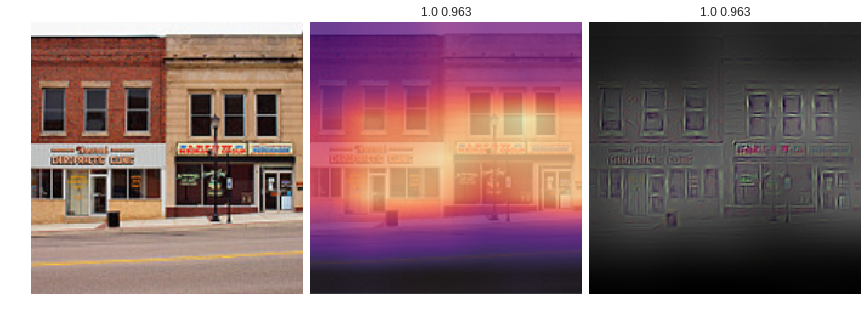

In [0]:
for i in range(150,170):
  gcam = GradCam.from_interp(learn,interp,i)
  gcam.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


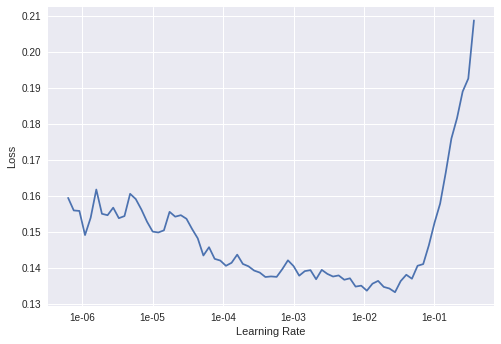

In [0]:
learn.lr_find()
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(6, max_lr=1e-05)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.114399,0.122010,0.042572,0.957428,03:57
1,0.115951,0.120362,0.042572,0.957428,03:57
2,0.108827,0.121778,0.044334,0.955666,03:57
3,0.117655,0.118992,0.043159,0.956841,03:57
4,0.117131,0.119994,0.042278,0.957722,03:57
5,0.120117,0.119736,0.042572,0.957428,03:57


In [0]:
make_submission_tta(learn, 'places_res50_224x224_unfrozen_lr_tta.csv')

In [0]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


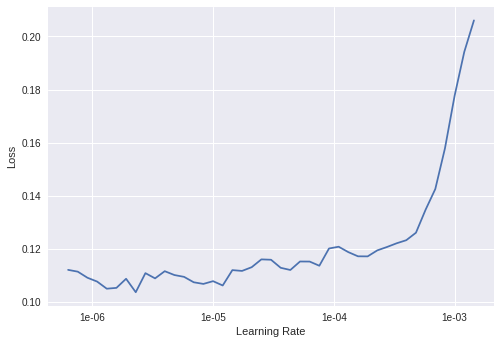

In [0]:
learn.lr_find()
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(6, max_lr=1e-06)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.106525,0.120734,0.044040,0.955960,05:10
1,0.122022,0.122159,0.044627,0.955373,05:10
2,0.110514,0.121242,0.044040,0.955960,05:10
3,0.111088,0.121535,0.044627,0.955373,05:11
4,0.111081,0.124397,0.044040,0.955960,05:10
5,0.114640,0.119270,0.044334,0.955666,05:11


## Lowest confidence

In [0]:
log_preds, test_labels = learn.get_preds(ds_type=DatasetType.Test)

In [0]:
log_preds

tensor([[2.9094e-05, 3.0019e-05, 9.4163e-01, 5.8028e-02, 1.1662e-04, 1.6274e-04],
        [2.0429e-05, 3.8050e-04, 1.4173e-02, 9.8496e-01, 4.1282e-04, 4.9613e-05],
        [1.0004e-05, 6.1412e-06, 9.9738e-01, 2.4292e-03, 1.6402e-04, 1.0239e-05],
        ...,
        [3.2296e-05, 1.1787e-05, 9.7403e-01, 2.5864e-02, 1.4107e-05, 4.4399e-05],
        [9.1257e-08, 9.9990e-01, 8.2153e-05, 1.4400e-05, 2.4901e-07, 5.2442e-07],
        [6.6814e-08, 1.0000e+00, 4.0579e-07, 5.5589e-07, 1.8631e-08, 2.4692e-08]])

In [0]:
preds = np.argmax(log_preds, 1)
preds

tensor([2, 3, 2,  ..., 2, 1, 1])

In [0]:
log_preds.shape

torch.Size([7301, 6])

In [0]:
conf = np.amax(np.array(log_preds), 1)

In [0]:
min(conf)

0.3176765

In [0]:
submission = pd.DataFrame({'image_name': os.listdir('data/test'), 'confidence': conf, 'label': preds})
# submission.to_csv(path/filename, index=False)

In [0]:
submission.head()

,confidence,image_name,label
0,0.941634,6688.jpg,2
1,0.984964,2918.jpg,3
2,0.997380,4490.jpg,2
3,0.998427,15722.jpg,0
4,0.466612,22796.jpg,4


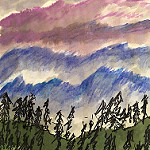

In [0]:
data.test_ds.x[1]

In [0]:
os.listdir('data/test')

In [0]:
df_sorted = submission.sort_values(by=['confidence'])
df_sorted

,confidence,image_name,label
387,0.317677,22551.jpg,2
445,0.348222,21931.jpg,3
7290,0.364647,22023.jpg,5
1101,0.380768,9183.jpg,2
6276,0.395335,9165.jpg,4
6909,0.428051,23921.jpg,2
5194,0.429093,4683.jpg,3
3427,0.430105,1313.jpg,5
870,0.454374,6882.jpg,3
6657,0.455679,21223.jpg,2


In [0]:
i = 4
img = open_image(path/'test'/df_sorted['image_name'].values[i])
print(df_sorted['label'].values[i])

4


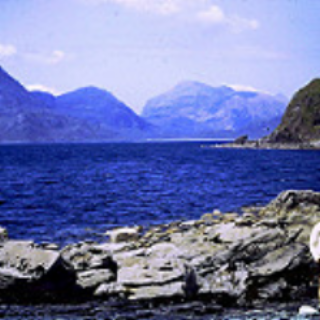

In [0]:
img.resize(320)

## Training with merging validation set

In [0]:
def get_data(sz, bs):
  data = ImageDataBunch.from_csv(path=path, folder='train', csv_labels='train.csv', test='test', ds_tfms=get_transforms(), size=sz, bs=bs, valid_pct=0).normalize(imagenet_stats)
  return data

In [0]:
learn = cnn_learner(get_data(128, 128), new_resnet, metrics=[error_rate, accuracy])

In [0]:
learn.fit_one_cycle(5)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


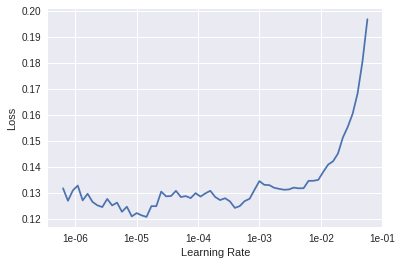

In [0]:
learn.lr_find()
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(6, max_lr=1e-05)

In [0]:
learn.save('places_res50_128x128_no_val')

In [0]:
learn = cnn_learner(get_data(128, 128), new_resnet, metrics=[error_rate, accuracy]).load('places_res50_128x128_no_val')

In [0]:
make_submission_tta(learn, 'places_res50_128x128_no_val_tta')